# 2.155/6 Demo 9: Working Diffusion Models and Generating High Quality Images of Bikes! - Diffusion With Guidance (Demo Notebook)

<div style="font-size: tiny;">
License Terms:  
These Python demos are licensed under a <a href="https://creativecommons.org/licenses/by-nc-nd/4.0/">Creative Commons Attribution-NonCommercial-NoDerivatives 4.0 International License</a>. They are intended for educational use only in Class 2.155/2.156: AI and ML for Engineering Design at MIT. You may not share or distribute them publicly, use them for commercial purposes, or provide them to industry or other entities without permission from the instructor (faez@mit.edu).
</div>


## **Notebook Description**
Intro video: https://youtu.be/getNRM2WiVU

In this demo we thought it would be best if we focus on the challege problem and give you all a good baseline to add to the solution in the starter notebook. We understand that training a model like the one you will see in this demo may be beyond your resources and time so we are giving you a model that we have trained and you can feel free to use it for your challenge problem submission!

---

Table of Contents:

Installs and Imports

Background

Setting up data

***Diffusion Models In More Detail:***
Looking at the inner workings of diffusion models with more depth.

***Conditional Inpainting***
Exploring inpainting using conditional diffusion models.

***Guidance-based Inpainting***
A further look into guidance-based inpainting.


***OPTIONAL(Will Be Released Later)***
For those intersted in more details on how the diffusion model can be setup and trained we have a seprate notebook in which we actually train the model and reveal the back end code a bit more!

***Reference Repository:***
[Hugging Face Model Card](https://huggingface.co/ahn1376/bikefusion)

## Setup
First we will set up the packages and tools we will need. We clone the CP3 code, perform a few imports, then clone the github repository of our model called BikeFusion! The *bikefusion* repository contains a pretrained diffusion model for this demo and the CP3 project! We will use some of the tools in *bikefusion* in this demo.

In [1]:
import utils

import numpy as np
import torch
from huggingface_hub import snapshot_download
import sys
from pathlib import Path
from tqdm.auto import tqdm, trange

# Download the bikefusion repository
repo_dir = snapshot_download("ahn1376/bikefusion",local_dir="./bikefusion")

import bikefusion

Fetching 29 files:   0%|          | 0/29 [00:00<?, ?it/s]

## Diffusion Models Background

As we have seen in class and in the previous demo, diffusion models are a class of generative models that create data by reversing a diffusion process. They start with random noise and iteratively refine it to produce coherent data, such as images. This process involves learning to denoise data step by step, effectively generating new samples that resemble the training data.

**Key Concept:**
- Begin with random noise
- Iteratively apply denoising steps
- Generate realistic data samples

Below is an animation illustrating the diffusion process:

![Diffusion Process Animation](https://developer-blogs.nvidia.com/wp-content/uploads/2022/04/Diffusion-Denoiser-2.gif)**[source](https://developer.nvidia.com/blog/improving-diffusion-models-as-an-alternative-to-gans-part-2/)**

In this notebook we will see how versatile these models can be in many different scenarios. To showcase the power of these models we will be focusing on solving the challenge problem we gave you using diffusion models.



## Problem Description: Image Completion for Design Concept Visualization

#### **Objective**
Develop a generative model to complete partial design concept images for a bike company. Given a partial image of a bike design, the model should predict the complete design.

#### **Dataset**
- **Training Data:** 10,000 design samples, each consisting of:
  - A complete design image
  - A corresponding partial image
- **Evaluation Data:** 1,000 partial images for testing the model's performance on completing designs.

#### **Task Description**
The goal is to train a model that can accurately reconstruct the full design from the partial input, using only the image data. This task is an example of ***image inpainting***, where the goal is to fill in missing or occluded parts of an image. Inpainting models learn to generate the missing content in a way that seamlessly integrates with the existing visible parts, producing a complete, realistic image.


#### **Technical Challenges**
1. **Image Reconstruction Quality:** The model must learn to generate a realistic, coherent extension of the provided partial images.
2. **Sampling Challenges:** Some designs may deviate from typical bike structures, requiring robustness in the generative process which can provide many diverse candidates.

---

In the following sections, we will:
1. Load and preprocess the training data.
2. Look at different ways a diffusion model can be used in this context.
  - Conditional Diffusion
  - Guidance
  - Hybrid Conditional + Guided Diffusion
3. Evaluate the model on the provided test set.


## Looking At The Data
First let's take a closer look at the data. Like in the starter notebook, we use the `load_data` function.

In [2]:
partial_images, masks, parametric, description, targets  = utils.load_data()

Now let's take a look at what this data looks like:

In [3]:
print(f"Masked images: array with shape: {partial_images.shape}")
print(f"Masks: array with shape: {masks.shape}")
print(f"Parametric: array with shape: {parametric.shape}")
print(f"Description: list with length: {len(description)}")
print(f"Images: array with shape: {targets.shape}")

Masked images: array with shape: (10000, 3, 80, 128)
Masks: array with shape: (10000, 4)
Parametric: array with shape: (10000, 96)
Description: list with length: 10000
Images: array with shape: (10000, 3, 80, 128)


We have also noted which indices of the training data we used to train the diffusion model we provide and which we held out for validation. As you can see, we trained on 8000 and saved 2000 for validation.

In [4]:
train_indices = np.load("data/diffusion_train_indices.npy")
val_indices = np.load("data/diffusion_val_indices.npy")

print(f"Training indices: {train_indices}")
print(f"Validation indices: {val_indices}")
print(f"Number of training samples: {len(train_indices)}")
print(f"Number of validation samples: {len(val_indices)}")

Training indices: [7542 8214 3698 ... 3325 7623 5220]
Validation indices: [4895 1551 6385 ... 7126 5089 7716]
Number of training samples: 8000
Number of validation samples: 2000


As we saw in the starter notebook, the masks are in coordinate format specifically `[top, right, bottom, left]`. We have given you a function called `get_mask_channel` which takes a bunch of mask coordinates and gives us the mask map or mask images:

In [5]:
def get_mask_channel(images, masks):
    # Create an empty mask channel with the same spatial dimensions
    mask_channel = np.zeros((images.shape[0], images.shape[2], images.shape[3]))

    # Populate the mask channel based on the coordinates in masks
    for i in trange(masks.shape[0]):
        mask_channel[i, masks[i][3]:masks[i][1], masks[i][0]:masks[i][2]] = 1.0

    return mask_channel
mask_maps = get_mask_channel(partial_images, masks)[:, None, :, :]

  0%|          | 0/10000 [00:00<?, ?it/s]

Now let's take a look at this data:

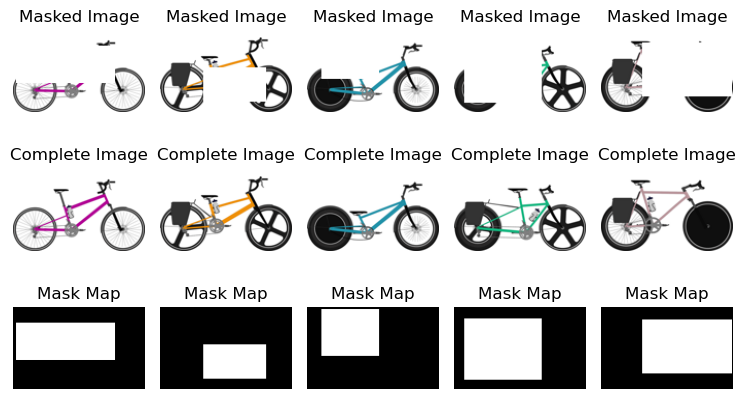

In [6]:
# get a random set of images from our training set
n = 5
idx = np.random.choice(len(targets), n, replace=False)

# plot the images
bikefusion.visualize_imagesets(partial_images[idx],
                    targets[idx],
                    mask_maps[idx],
                    titles=["Masked Image", "Complete Image", "Mask Map"])

### Data Preprocessing:

Here, we take some preprocessing steps that differ from the starter notebook. Most notably, we will pad these 80x128 images to be square 128x128 images, in order to more easily use standard off-the-shelf U-Net models (which are the backbone of the diffusion model). Like the starter notebook, we will scale the data which is currently [0,255] 8-bit integers. However, this time, we scale it to [-1,1], rather than [0,1] (the noising process is more intuitive when centered around 0). We have wrapped all this in a function from bikefusion called preprocess. **Please be vigilant that this preprocessing differs from the preprocessing in the starter notebook.**

In [7]:
training_images = bikefusion.preprocess(targets) # apply preprocessing

Now let's see what has happend:

In [8]:
print(f"Original Images: {targets.shape}, Values Range: [{targets.min()}, {targets.max()}]")
print(f"Preprocessed Images: {training_images.shape}, Values Range: [{training_images.min()}, {training_images.max()}]")

Original Images: (10000, 3, 80, 128), Values Range: [0, 255]
Preprocessed Images: torch.Size([10000, 3, 128, 128]), Values Range: [-1.0, 1.0]


We have also provided a function called `postprocess` which reverses this for later when we generate stuff and want to go back to our original representation.

In [9]:
remapped = bikefusion.postprocess(training_images)

In [10]:
print(f"Original Images: {targets.shape}, Values Range: [{targets.min()}, {targets.max()}]")
print(f"Preprocessed Images: {training_images.shape}, Values Range: [{training_images.min()}, {training_images.max()}]")
print(f"Remapped Images: {remapped.shape}, Values Range: [{remapped.min()}, {remapped.max()}]")

Original Images: (10000, 3, 80, 128), Values Range: [0, 255]
Preprocessed Images: torch.Size([10000, 3, 128, 128]), Values Range: [-1.0, 1.0]
Remapped Images: (10000, 3, 80, 128), Values Range: [0, 255]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


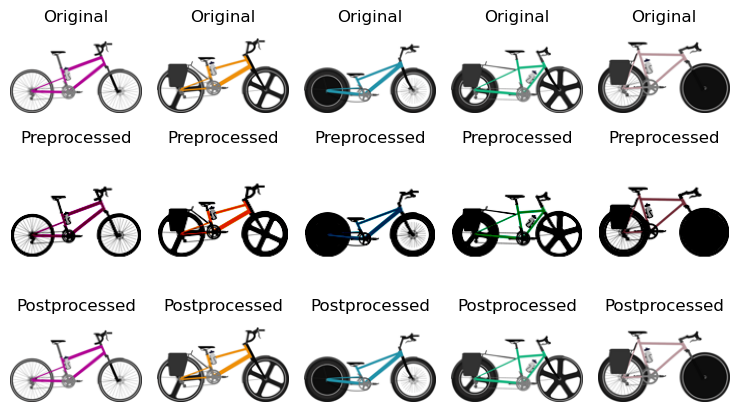

In [11]:
bikefusion.visualize_imagesets(targets[idx], training_images[idx], remapped[idx], titles=["Original", "Preprocessed", "Postprocessed"])

In [12]:
del remapped, training_images # remove to free ram

## Inpainting With Diffusion Models
In this notebook we won't be training a diffusion since using colab for diffusion model training is a bit impractical. So for this notebook we have trained a diffusion model for you and we will load it here using a function we have given you called `load_bikefusion`.

In [13]:
Diffuser = bikefusion.load_bikefusion()

c:\Users\Enriq\Desktop\Enrique\MIT\F24\2.156 - AI and ML for Engineering Design\Python\2.156_Demo9\bikefusion\bikefusion\diffusion.py:101: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental

Epoch information not found in checkpoint setting epoch to 0


Before generating stuff however, let us look at the inner workings of our diffusion model a bit. Let's see what the arcitecture of the unet looks like:

In [14]:
from torchinfo import summary

# Pass the inputs as a tuple
summary(Diffuser.unet)

Layer (type:depth-idx)                        Param #
UNet2DModel                                   --
├─Conv2d: 1-1                                 7,040
├─Timesteps: 1-2                              --
├─TimestepEmbedding: 1-3                      --
│    └─Linear: 2-1                            66,048
│    └─SiLU: 2-2                              --
│    └─Linear: 2-3                            262,656
├─ModuleList: 1-4                             --
│    └─DownBlock2D: 2-4                       --
│    │    └─ModuleList: 3-1                   722,688
│    │    └─ModuleList: 3-2                   147,584
│    └─AttnDownBlock2D: 2-5                   --
│    │    └─ModuleList: 3-3                   527,360
│    │    └─ModuleList: 3-4                   2,362,880
│    │    └─ModuleList: 3-5                   590,080
│    └─AttnDownBlock2D: 2-6                   --
│    │    └─ModuleList: 3-6                   2,103,296
│    │    └─ModuleList: 3-7                   8,920,064
│    │    └

This model takes as input 128x128 images with **6** channels. This is because this model is a conditional diffusion model. The first three channels of the input are the incomplete image we are conditioning the model on, while the last three are the starting random noise. However, we also trained the model to generate sample unconditionally. That is to say if the partial image you feed in the first three channels is just a white image the model will just generate an entire bike. In practice we provide an interface to supply the three conditional channels (more info below).

Before we get to generating let's look at the how the model adds noise to the data during training:

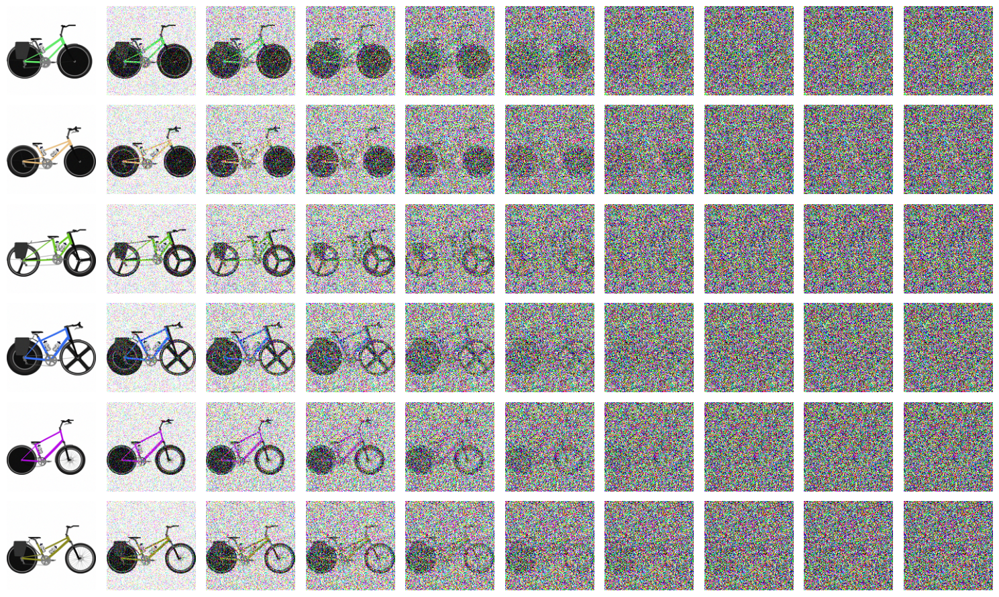

In [15]:
noise_evolution = Diffuser.get_sample_noising(n_samples=6,n_timesteps=10)

bikefusion.visualize_image_evolution((noise_evolution.clip(-1,1)+1)/2)

Now let's see how well this trained model generates bikes without any conditioning or inpainting. For simplicity we will run the diffusion with only 10 steps. For higher quality, taking 50-100 inference steps is better.

  0%|          | 0/10 [00:00<?, ?it/s]

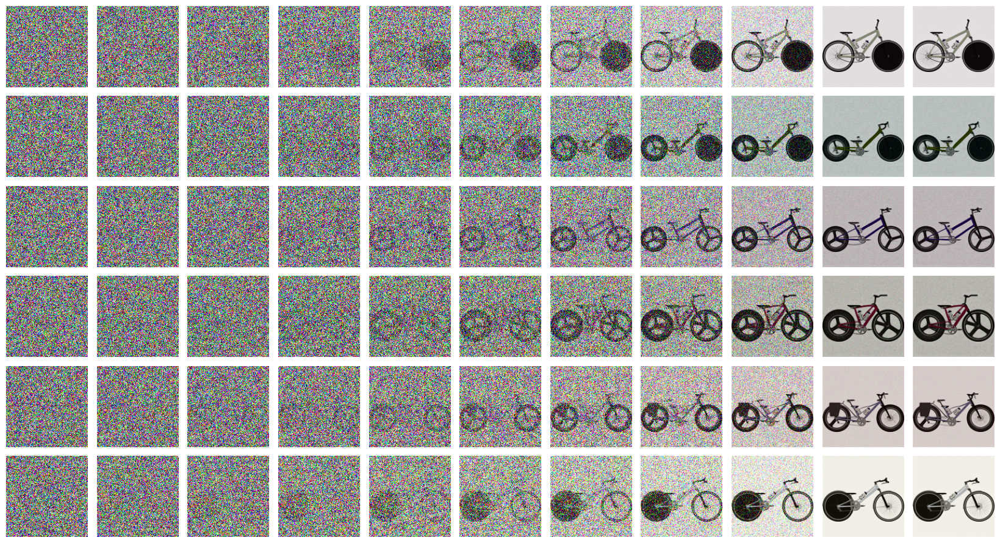

In [16]:
denoising = Diffuser.generate(n_samples=6, return_intermediate=True, num_inference_steps=10) # only 10 steps!!!

bikefusion.visualize_image_evolution((denoising+1)/2)

Not bad! these bikes look pretty nice. Of course there is some color shifting happening but that can be fixed easily as we will see.

### Conditional Inpainting
As we said out model is a conditional model which can take as input partial images and complete them and this is something we train for. To see how the training pipeline samples random masks for inpatining (and sometimes just masks the whole image to learn unconditional generation) let's visualize a set of training inputs from the model:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..

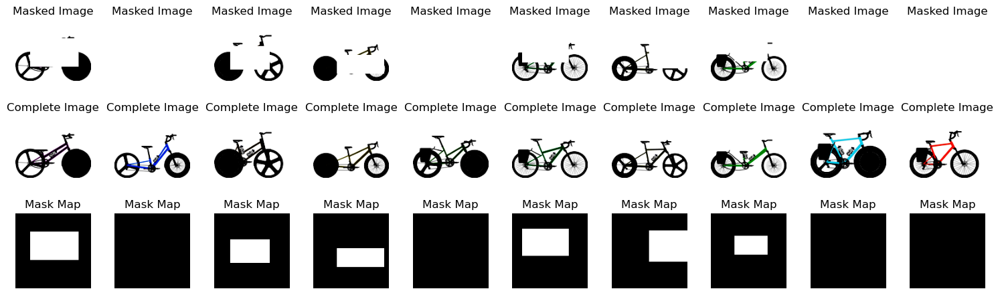

In [17]:
masked_samples, sample_masks, image_samples = Diffuser.get_sample_batch(10, split="Validation")

bikefusion.visualize_imagesets(masked_samples, image_samples, sample_masks, titles=["Masked Image", "Complete Image", "Mask Map"])

You can see that during training some bikes are masked randomly while others are fully hidden to learn unconditional geneation too. Now let's try inpainting with conditional generation. We grab 8 examples from the validation set and have at it:

  0%|          | 0/50 [00:00<?, ?it/s]

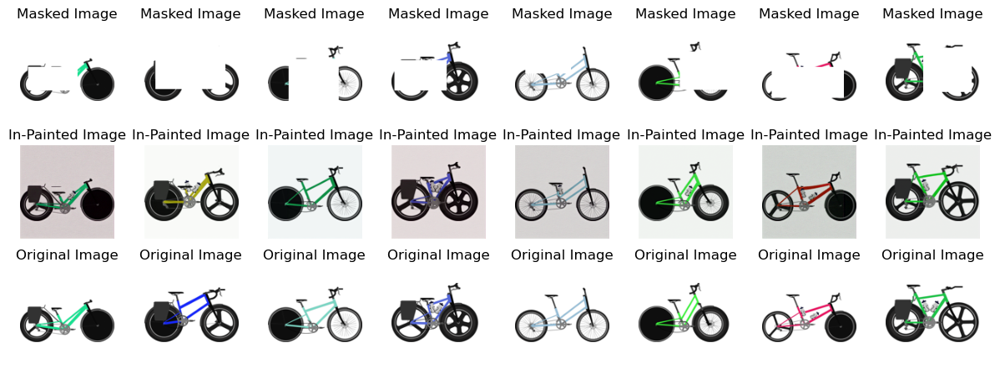

In [18]:
Diffuser.full_image_probability = 0.0 # do not sample pure generation
masked_samples, sample_masks, image_samples = Diffuser.get_sample_batch(8, split="Validation")

#=====================================================================================
#   Conditional Model parameter set up
#=======================================================================================

Diffuser.full_image_probability = 0.5 # reset the parameter to default

infilled = Diffuser.generate(torch.tensor(masked_samples), num_inference_steps=50)  #pass in masked samples as conditioning information

bikefusion.visualize_imagesets((masked_samples+1)/2, (infilled+1)/2, (image_samples+1)/2, titles=["Masked Image", "In-Painted Image", "Original Image"])

This may be slow using the colab T4 GPU but with a good GPU or colab pro with L40 or A100 this will be very fast. But we can see that the model has done a great job at filling up partial images!

But how accurate is it? Let's use the scoring function from the CP to evaluate. First, we will use the function to combine the predicitons with the known portions of the image.

In [19]:
def combine_orig_and_pred(masked_images, predicted_images, masks):
    combination = predicted_images*masks + masked_images*(1-masks)
    return combination

Now we combine our predictions with our known pixel values, call our postprocessing function and score!

In [20]:
combination = combine_orig_and_pred(masked_samples, infilled, sample_masks)
preds = bikefusion.postprocess(combination)
gt = bikefusion.postprocess(image_samples)
mean_score, scores = utils.calculate_composite_score(preds, gt)
print(f"Mean Composite Score: {mean_score}")

Mean Composite Score: 0.9445369243621826


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9529412..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data

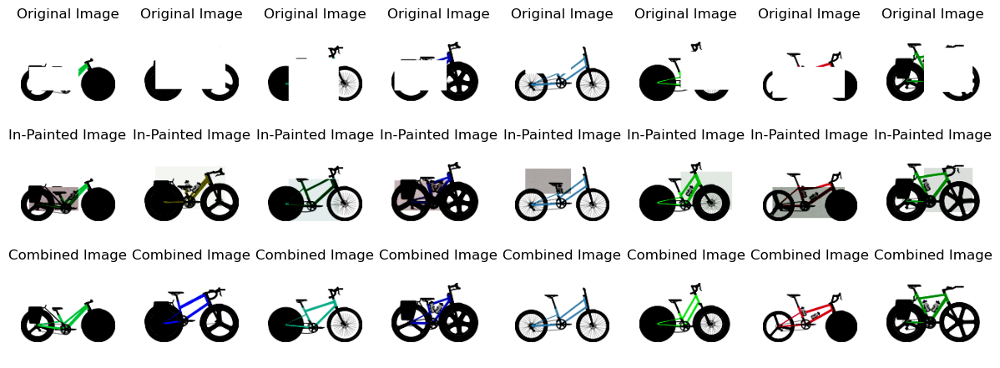

In [21]:
bikefusion.visualize_imagesets(masked_samples, combination, image_samples, titles=["Original Image", "In-Painted Image", "Combined Image"])

How consitent are the scores? Lets generate another set of predictions for the same data. We can see that the individual scores vary quite widely.

  0%|          | 0/50 [00:00<?, ?it/s]

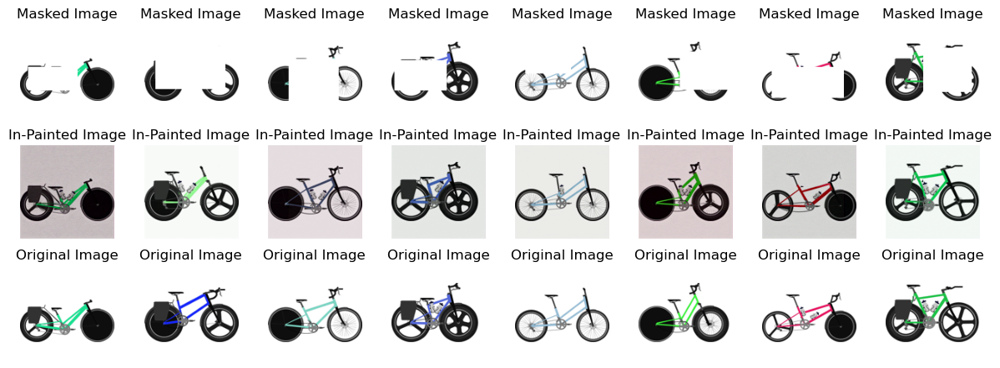

Second Run Mean Composite Score: 0.9322766661643982
First run individual Scores: [0.9540554  0.90983605 0.95228386 0.9551162  0.955436   0.9635517
 0.9142714  0.95174444]
Second run individual Scores: [0.9476378  0.8977644  0.9227719  0.9609266  0.97154194 0.9176412
 0.9107635  0.9291661 ]


In [22]:
infilled_2 = Diffuser.generate(torch.tensor(masked_samples), num_inference_steps=50)
bikefusion.visualize_imagesets((masked_samples+1)/2, (infilled_2+1)/2, (image_samples+1)/2, titles=["Masked Image", "In-Painted Image", "Original Image"])
combination_2 = combine_orig_and_pred(masked_samples, infilled_2, sample_masks)
preds_2 = bikefusion.postprocess(combination_2)
mean_score_2, scores_2 = utils.calculate_composite_score(preds_2, gt)
print(f"Second Run Mean Composite Score: {mean_score_2}")

print(f"First run individual Scores: {scores}")
print(f"Second run individual Scores: {scores_2}")

We can see that the generated samples look quite a bit different the second time, indicating that there is a fair amount of variability. The scores are also accordingly different.

But it seems like the color issues are significantly impacting performance.

Great! We have explored one method for in-painting in conditional diffusion. The other approach is with something called guidance!

## Guidance-Based Inpainting
In diffusion models, **guidance** is a powerful tool that directs the generation process toward specific outputs, even if the model was trained for a broader task.

Let's say we trained the model to generate generic bike images. Using a guidance function, we can "steer" the model to focus on completing missing parts of a specific bike image (inpainting) rather than generating a new, unrelated bike design.

### How Guidance Works
1. **Unconditioned vs. Conditioned Output:** During training, a diffusion model learns to denoise random noise into an image over several steps. For guidance-based inpainting, we introduce a guidance function that influences these denoising steps to match the context of the partial image.
  
2. **Gradient-Based Guidance:** A common guidance approach involves modifying the denoising process with gradients from a predefined objective. For example, by adding gradients that encourage the generated image to match visible regions in the partial input, the model generates missing parts that fit seamlessly into the provided image.

3. **Classifier-Free Guidance:** Another approach is **classifier-free guidance**, where the model can generate two outputs: one without any conditioning (general bike image) and one with conditioning (e.g., matching the partial input). We can then blend these outputs, giving more weight to the conditioned version, which directs the model to fill in missing regions that align with the context of the visible part.

Through guidance, the model adapts its output specifically to the given partial image, creating a plausible completion without requiring explicit retraining or restructuring of the model. In this code we have added a feature for **Gradient-Based Guidance**. You can define any differentiable torch-based function which takes a batch of images (noisy images during denoising) and the current denoising step (t) and compute an objective you want to minimize during generation. This means you will guide the de-noising process based on the gradients of this function. Below we will define a function which takes partially denoised images and guides the model to match the known parts of the image (unmasked sections) while filling out the the unkown regions. To make this more stable we will apply less guidance in the intial phases of denoising and transition to more aggresive at the end of the diffusion process to force the image to look like the real thing.



  0%|          | 0/50 [00:00<?, ?it/s]

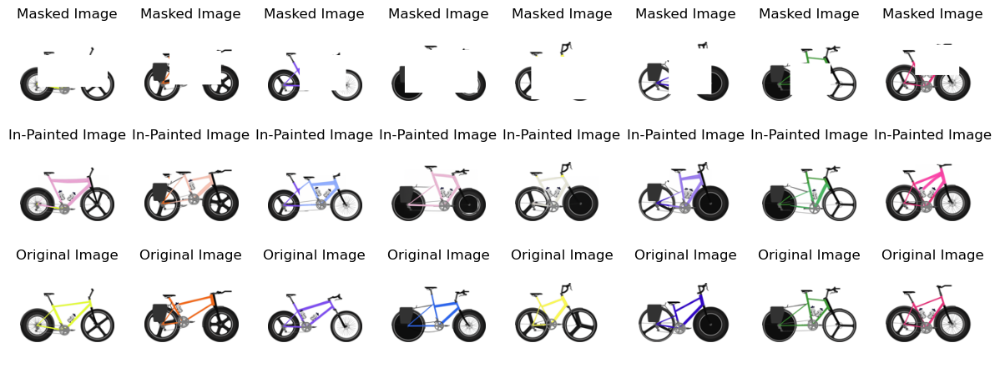

In [29]:
# First get a batch of partial images
Diffuser.full_image_probability = 0.0 # do not sample pure generation
masked_samples, sample_masks, image_samples = Diffuser.get_sample_batch(8, split="Validation")
Diffuser.full_image_probability = 0.5 # reset the parameter to default

# Now we will keep the masks and partial images for guidance
masked_samples_tens = torch.tensor(masked_samples).to(Diffuser.device)
sample_masks_tens = torch.tensor(sample_masks).to(Diffuser.device)

# define our guidance objective (must use torch and be differentiable)
# Our objective is to minimize the error between the predictions and the ground truth in the unmasked portions of the image
def sample_guidance(denoised_images, timestep): #Calculates said error
    # first let's remove the unkown part of the image we do not want to guide anything here
    un_masked_portion = denoised_images*(1-sample_masks_tens) + sample_masks_tens

    # now we will use the squared error as the objective of our guidance
    # we will also scale by time steps. At noisy steps, i.e. higher timesteps we
    # want less guidance since the model is still just seeing noise.
    error = torch.square(masked_samples_tens - un_masked_portion).sum() * (1000-timestep)/1000

    return error

# now let's do unconditioned but guided diffusion
# guidance scale is the scalar multiplied to the guidance based modification to
# samples lower makes the guidance weaker and higher will force the guidance
#aggressively
infilled = Diffuser.generate(n_samples=8, num_inference_steps=50, guidance_function=sample_guidance, guidance_scale=0.5)

# visualize
bikefusion.visualize_imagesets((masked_samples+1)/2, (infilled+1)/2, (image_samples+1)/2, titles=["Masked Image", "In-Painted Image", "Original Image"])

Ok nice, by guiding we have kind of gotten rid of the color shifts in the uncoditional and conditional geneation since we guided on all of the unmasked image including the whites!

Now any differentiable function could have been used for guidance, say a contrastive model for text and image like CLIP could be used to guide the model to generate images that matches a text prompt. Sounds familiar?
This is one of the ways models like Dall-E and Stable diffusion work!

Alright, lets calculate some scores for our guidance-based diffusion model:

In [28]:
combination = combine_orig_and_pred(masked_samples, infilled, sample_masks)
preds = bikefusion.postprocess(combination)
gt = bikefusion.postprocess(image_samples)
mean_score, scores = utils.calculate_composite_score(preds, gt)
print(f"Mean Composite Score: {mean_score}")
print(f"Individual Scores: {scores}")

Mean Composite Score: 0.9475396275520325
Individual Scores: [0.96942174 0.9318848  0.97161365 0.9018476  0.9667801  0.96575284
 0.9635454  0.9094708 ]


Once again, we can see how consistent the model is by asking for another set of predictions for the same mask:

  0%|          | 0/50 [00:00<?, ?it/s]

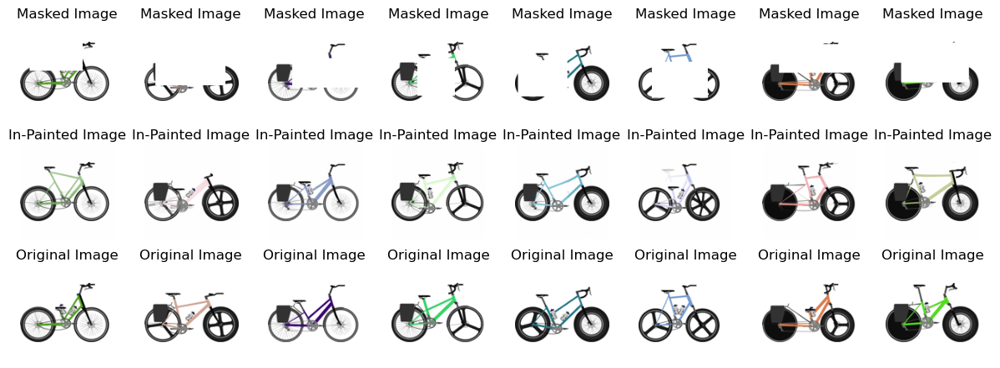

Second Run Mean Composite Score: 0.9396123886108398
First run individual Scores: [0.9662702  0.93553215 0.9609928  0.9519396  0.91865593 0.94894505
 0.96434015 0.93890893]
Second run individual Scores: [0.970563   0.92944217 0.9429726  0.956995   0.92404723 0.9265417
 0.9561079  0.91022927]


In [25]:
infilled_2 = Diffuser.generate(n_samples=8, num_inference_steps=50, guidance_function=sample_guidance, guidance_scale=0.05)
bikefusion.visualize_imagesets((masked_samples+1)/2, (infilled_2+1)/2, (image_samples+1)/2, titles=["Masked Image", "In-Painted Image", "Original Image"])
combination_2 = combine_orig_and_pred(masked_samples, infilled_2, sample_masks)
preds_2 = bikefusion.postprocess(combination_2)
mean_score_2, scores_2 = utils.calculate_composite_score(preds_2, gt)
print(f"Second Run Mean Composite Score: {mean_score_2}")

print(f"First run individual Scores: {scores}")
print(f"Second run individual Scores: {scores_2}")

Ok! It looks like the guided diffusion model is achieving scores similar to the VAE. This may be a bit counterintuitive because the samples look significantly better visually. However, as you may notice, the diffusion model is often confidently guessing the interior of the mask incorrectly. How might you be able to leverage the diverse realistic-looking samples from the diffusion model?

## Reflection Questions: ##

 **2.155 Students:** Please attempt one of the coding options below: implementation of a Hybrid Guidance-Conditioning OR a Custom Guidance Function

 **2.156 Students:** Please attempt both coding options below.


Tell us about what you tried! Answer some of the questions below for your demo reflection. Share some code and images of bikes! Here are a few suggestions for writing prompts.

A) Play around with the guidance_scale parameter. What is the trend when you try to change it?
Show us some images of bikes generated with different hyperparameter values.

*Ans:*

I increased the guidance_scale from 0.15 to 0.85 in a total of 5 variable steps. The results can be seen in the following images:

guidance_scale = 0.15 | Mean Composite Score: 0.957

![0.15](https://raw.githubusercontent.com/enriquef13/2.156_Demo9/refs/heads/main/output_0.15.png)

guidance_scale = 0.25 | Mean Composite Score: 0.951

![0.25](https://raw.githubusercontent.com/enriquef13/2.156_Demo9/refs/heads/main/output_0.25.png)

guidance_scale = 0.45 | Mean Composite Score: 0.963

![0.45](https://raw.githubusercontent.com/enriquef13/2.156_Demo9/refs/heads/main/output_0.45.png)

guidance_scale = 0.65 | Mean Composite Score: 0.948

![0.65](https://raw.githubusercontent.com/enriquef13/2.156_Demo9/refs/heads/main/output_0.65.png)

guidance_scale = 0.85 | Mean Composite Score: 0.947

![0.85](https://raw.githubusercontent.com/enriquef13/2.156_Demo9/refs/heads/main/output_0.85.png)

We can see a summary of the obtained results:

- guidance_scale = 0.15 | Mean Composite Score: 0.957
- guidance_scale = 0.25 | Mean Composite Score: 0.951
- **guidance_scale = 0.45 | Mean Composite Score: 0.963**
- guidance_scale = 0.65 | Mean Composite Score: 0.948
- guidance_scale = 0.85 | Mean Composite Score: 0.947

From this analysis, it seems like the optimal configuration is around a guidance_scale of 0.5, as equal weight is given to purely probabilistic generation and gradient-based guided generation. This analysis, however, cannot be conclusive given that the scores are only calculated for a small sample size of 8 bike images.

B) Did you try a custom guidance function? What did you try? Show some pictures of the bikes you generated!

*Ans:*

Yes! The code and image of the generated designs can be seen at the end of the notebook. I implemented a function that penalizes deviations from the white background that is present in all of the designs in the dataset. These are the results after running for 10 inference steps.

C) Compare a combined hybrid guidance-conditioning model to the base, conditional, and guided models. What are some differences between the bikes created by each model? What are some pros and cons of each type of model?

*Ans:*

Below we can see the implementation of the 4 model variations using the same image samples. They ran only for 10 inference steps. A summary of the things to note for each one of them:

- Base: Mean score = 0.86. No consideration for the unmasked portion of the image, which leads to completely random bike generations. 
- Conditional: Mean score = 0.91. Uses the unmasked portion of the image to generate only the masked portion. This happens because the model was originally trained using both partially and completely masked images. This is advantegous, as the model does not have to "guess" what the entire design looks like.
- Guided: Mean score = 0.94. Uses the unmasked portion of the image. This is done through a loss function that, in this case, computes a gradient to ensure that the generated design matches the unmasked image. This makes the generations match the design more uniformly, as both the background and the bike design are accounted for. This is not the case in conditional training, at least when the number of inference steps is small. 
- Hybrid (Conditional + Guided): Mean score = 0.96. By combining the previous two methods, it leverages both the training from the model on masked images, and the continuous computation of the gradient-based error of the generation vs the unmasked portion of the image. This results in the highest similarity between the generated image and the original one, at least when running for 10 inference steps. 

  0%|          | 0/10 [00:00<?, ?it/s]

Base | Mean Composite Score: 0.8631862998008728


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7301385].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.70810974].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.75349194].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8171998].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7897928].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8758391].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.74116373].
Clipping input data to t

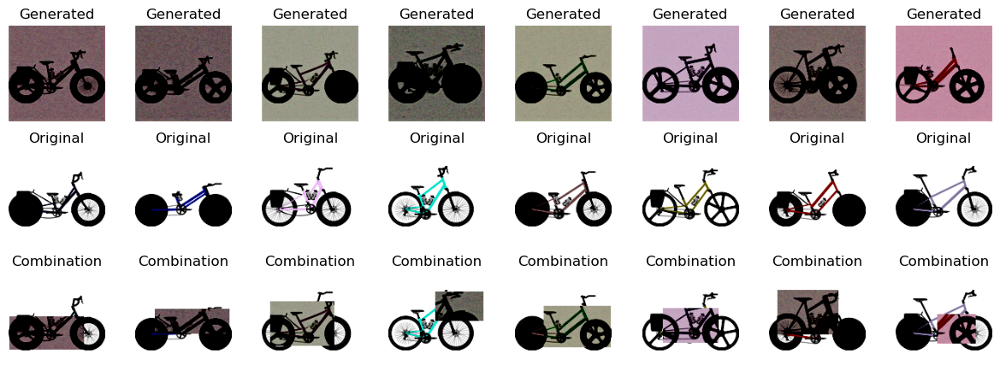

  0%|          | 0/10 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.74982685].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8161568].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8673811].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8822198].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.93294185].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7270507].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7689209].
Clipping input data to th

Conditional | Mean Composite Score: 0.9087018966674805


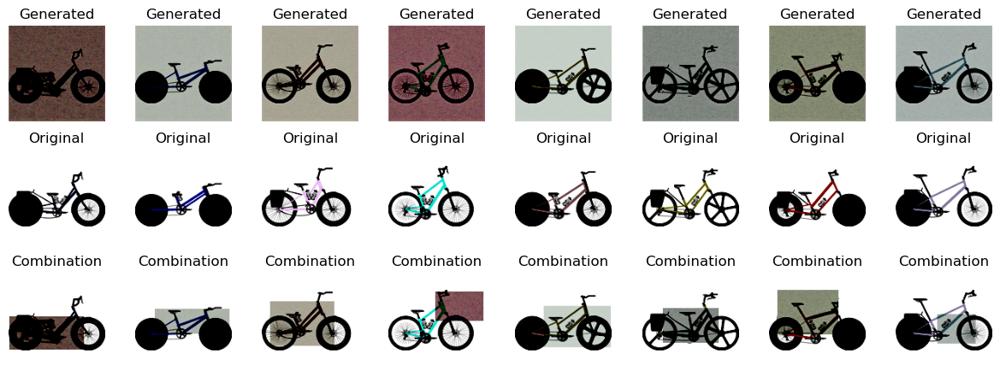

  0%|          | 0/10 [00:00<?, ?it/s]

Guided | Mean Composite Score: 0.9450404047966003


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99596804..1.0].
Clipping input data to the valid range for imshow with RGB dat

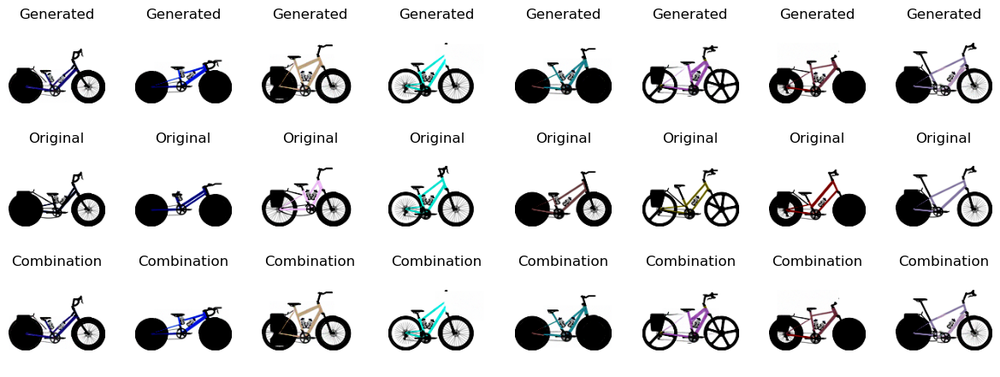

  0%|          | 0/10 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Hybrid | Mean Composite Score: 0.9565823674201965


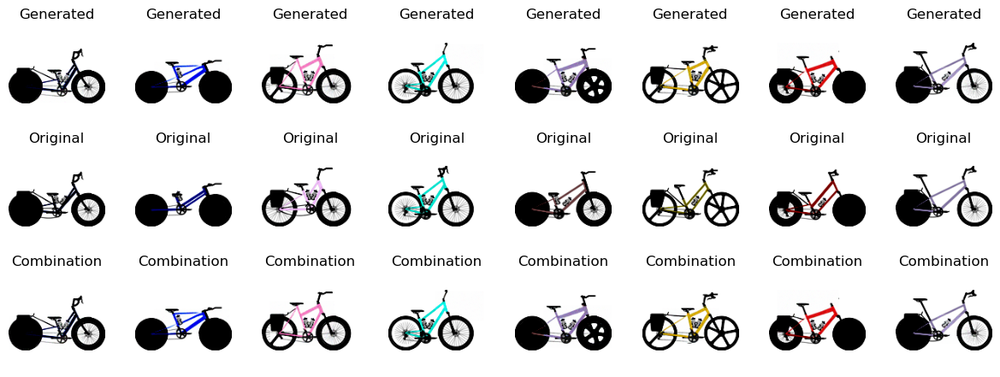

In [44]:
Diffuser.full_image_probability = 0.0
masked_samples, sample_masks, image_samples = Diffuser.get_sample_batch(8, split="Validation")
masked_samples_tens = torch.tensor(masked_samples).to(Diffuser.device)
sample_masks_tens = torch.tensor(sample_masks).to(Diffuser.device)

# Base model
generated = Diffuser.generate(n_samples=8, num_inference_steps=10)  #pass in masked samples as conditioning information
combination = combine_orig_and_pred(masked_samples, generated, sample_masks)
preds = bikefusion.postprocess(combination)
gt = bikefusion.postprocess(image_samples)
mean_score, scores = utils.calculate_composite_score(preds, gt)
print(f"Base | Mean Composite Score: {mean_score}")
bikefusion.visualize_imagesets(generated, image_samples, combination, titles=["Generated", "Original", "Combination"])

# Conditional model
infilled = Diffuser.generate(torch.tensor(masked_samples), num_inference_steps=10)
combination = combine_orig_and_pred(masked_samples, infilled, sample_masks)
preds = bikefusion.postprocess(combination)
mean_score, scores = utils.calculate_composite_score(preds, gt)
print(f"Conditional | Mean Composite Score: {mean_score}")
bikefusion.visualize_imagesets(infilled, image_samples, combination, titles=["Generated", "Original", "Combination"])

# Guided model
infilled = Diffuser.generate(n_samples=8, num_inference_steps=10, guidance_function=sample_guidance, guidance_scale=0.5)
combination = combine_orig_and_pred(masked_samples, infilled, sample_masks)
preds = bikefusion.postprocess(combination)
mean_score, scores = utils.calculate_composite_score(preds, gt)
print(f"Guided | Mean Composite Score: {mean_score}")
bikefusion.visualize_imagesets(infilled, image_samples, combination, titles=["Generated", "Original", "Combination"])

# Hybrid conditional + guided model
infilled = Diffuser.generate(torch.tensor(masked_samples), n_samples=8, num_inference_steps=10, guidance_function=sample_guidance, guidance_scale=0.5)
combination = combine_orig_and_pred(masked_samples, infilled, sample_masks)
preds = bikefusion.postprocess(combination)
mean_score, scores = utils.calculate_composite_score(preds, gt)
print(f"Hybrid | Mean Composite Score: {mean_score}")
bikefusion.visualize_imagesets(infilled, image_samples, combination, titles=["Generated", "Original", "Combination"])

## Hybrid Simultanious Guidance & Conditioning
Now let's combine both conditioning and guidance for maximum quality!

  0%|          | 0/50 [00:00<?, ?it/s]

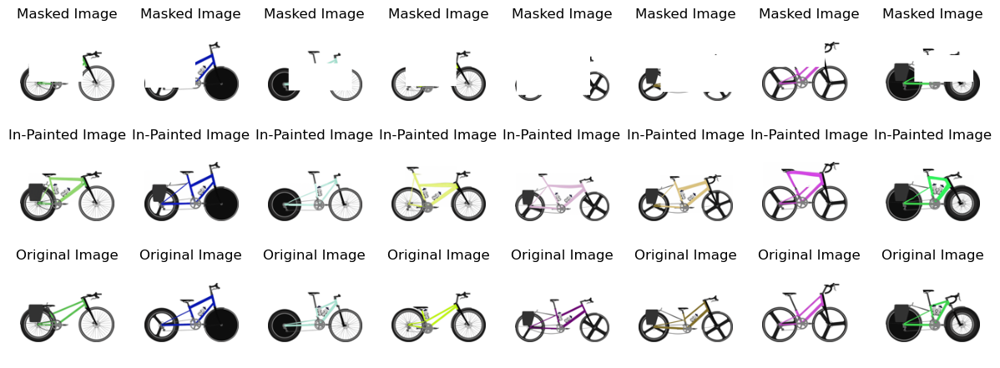

In [30]:
Diffuser.full_image_probability = 0.0 # do not sample pure generation
masked_samples, sample_masks, image_samples = Diffuser.get_sample_batch(8, split="Validation")
Diffuser.full_image_probability = 0.5 # reset the parameter to default

# Now we will keep the masks and partial images for guidance
masked_samples_tens = torch.tensor(masked_samples).to(Diffuser.device)
sample_masks_tens = torch.tensor(sample_masks).to(Diffuser.device)

def sample_guidance(denoised_images, timestep):
    un_masked_portion = denoised_images*(1-sample_masks_tens) + sample_masks_tens
    error = torch.square(masked_samples_tens - un_masked_portion).sum() * (1000-timestep)/1000
    return error

# Combination of conditional and guided diffusion
infilled = Diffuser.generate(masked_samples_tens, n_samples=8, num_inference_steps=50, guidance_function=sample_guidance, guidance_scale=0.5)

# visualize
bikefusion.visualize_imagesets((masked_samples+1)/2, (infilled+1)/2, (image_samples+1)/2, titles=["Masked Image", "In-Painted Image", "Original Image"])

In [31]:
combination = combine_orig_and_pred(masked_samples, infilled, sample_masks)
preds = bikefusion.postprocess(combination)
gt = bikefusion.postprocess(image_samples)
mean_score, scores = utils.calculate_composite_score(preds, gt)
print(f"Mean Composite Score: {mean_score}")
print(f"Individual Scores: {scores}")

Mean Composite Score: 0.9580790400505066
Individual Scores: [0.9635195  0.95419276 0.9740536  0.9637829  0.93689466 0.92759824
 0.97955316 0.9650373 ]


## Guidance Practice Problem
As part this demo we want you to come up with a simple guidance objective and try it out and show how you can play with gradient-based guidance to change the diffusion model's output!

Suggestion: How can you fix the color shiftting issue we saw when generating without guidance?

  0%|          | 0/10 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9529412..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data

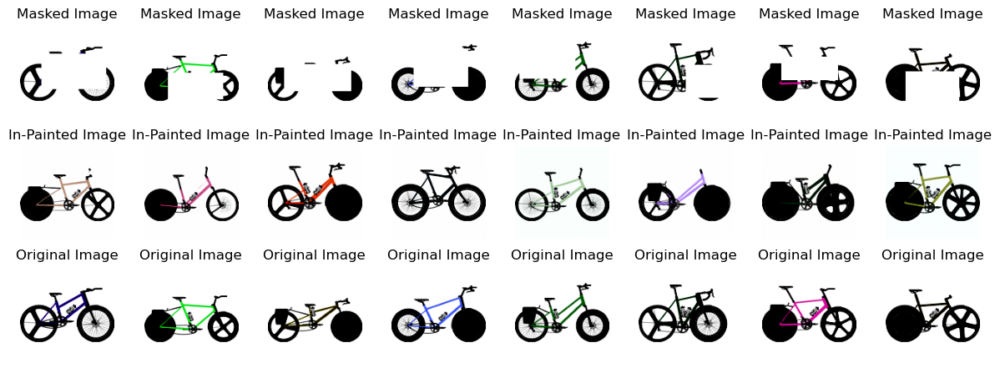

In [ ]:
Diffuser.full_image_probability = 0.0 # do not sample pure generation
masked_samples, sample_masks, image_samples = Diffuser.get_sample_batch(8, split="Validation")
Diffuser.full_image_probability = 0.5 # reset the parameter to default

masked_samples_tens = torch.tensor(masked_samples).to(Diffuser.device)
sample_masks_tens = torch.tensor(sample_masks).to(Diffuser.device)


# We followed the suggestion and wrote a function to minimize the deviation from white in the unmasked regions  
def custom_guidance(denoised_images, timestep):
    white_threshold = -0.2
    white_mask = torch.mean(masked_samples_tens, dim=1, keepdim=True) > white_threshold
    white_mask = white_mask.expand(-1, 3, -1, -1)
    
    # Combine with unmasked regions
    background_mask = white_mask * (1 - sample_masks_tens)
    
    # Quadratic penalty for deviation from white
    error = torch.mean((denoised_images - torch.ones_like(denoised_images))**2 * background_mask * 10000)
    
    return error

infilled = Diffuser.generate(n_samples=8, num_inference_steps=10, guidance_function=custom_guidance, guidance_scale=0.5)
bikefusion.visualize_imagesets(masked_samples, infilled, image_samples, titles=["Masked Image", "In-Painted Image", "Original Image"])